## Coursera - IBM Data Science Capstone Project ##

### Brian Lee ###
BrianTrewLee@gmail.com<br />
LinkedIn: https://www.linkedin.com/in/brian-lee-64a2022b/



## 1. Introduction ##

If I were to open a Starbucks, where should I locate it? Clearly, the location is one of the most important business decisions for this venture. Is there a science to locating a StarBucks? Can we create a machine learning model to predict where a StarBucks is likely to be located? I'd like to find out.

If a reliable model can be made, it could be used in the process of opening a store. It could be used as a final sanity check, or at the beginning stage, to select a promising location. If a trustworthy model predicts with a high degree of confidence that a Starbucks should be located in an area, but there is not one there yet, perhaps that is an opportunity.

Any person interested in opening a Starbucks should be interested in these results. This includes myself, other potential franchisees, and the Starbucks corporation itself, which operates many of it's own stores. The Starbucks competition might also be interested as they could possibly gain competitive insigths. I also believe others might be interested in this procedure, as it might be applied to predicting the location of other entities, based on the same sort of data.

The main purpose of this project is to prove the concept of predicting Starbuck's locations in general. I suspect it may work better or worse depending on the locations chosen for training and prediction, the radius size, and the specific features used in the model. I may vary those factors in order to prove the concept, which could then be applied carefully to a particular geographic area of interest at a later date.

### 2. Data ###

Foursquare (https://foursquare.com) is a company that crowdsources location data, tying latitude-longitude coordinates (and other things) with public venues, including many businesses, such as Starbucks locations. The features for the Starbucks location classifier will come from venue data from the Fourquare API. I will use venue category names (such as 'bar', 'Chinese restaurant', 'coffee shop') as features to classify an area as either an area with a Starbucks, or an area without one. I will use the venue name (e.g. 'Starbucks') to determine whether or not the venue is a Starbucks. An area containing a Starbucks contains at least one venue named 'Starbucks' within the radius supplied to the Foursquare API's explore' endpoint.

An area will be a circular area with a given radius. I have not determined that radius yet, and I might use more than one radius in this project. Within that radius, the Foursquare API will return venues. The larger the radius, the more venues that could be anticipated, and the higher likelihood of a Starbucks, but a larger radius is also less useful for business use. I have done some exploratory work with a radius of 300m.

The areas to be chosen should contain a mix of areas with Starbuck's and those without. I have done some exploratory work in a particular area of San Francisco. I located Starbucks with Google Maps and got latitude and longitude points making a box around that area. I could choose the train and test points at random within an area, or I could generate a grid covering an entire area. Given the constraints my Foursquare Developer account places on my searches, and knowing that binary classifiers work better with a good number of examples of both classes, I may want to generate areas that I know will be heavy with Starbucks locations. To that end, I discovered a Kaggle dataset (https://www.kaggle.com/starbucks/store-locations) containing the latitude and longitude coordinates of 25,600 worldwide Starbucks locations. I may or may not use that resource.

### 3. Methodology ###

I will generate a corpus of geographic points, and using a reasonable radius (perhaps 300m) a corpus of geographic areas. Each geographic area will have a feature set based on json data returned by the Foursquare API's 'explore' endpoint. I plan to use the category names of the returned venues as features for that area. I will use the venue names to determine whether oir not a Starbucks is in that area, and generate the labels from that. 

Once I have labelled data, I will use sklearn.model_selection.train_test_split to generate tarining and testing sets. Then I  can use any of a host of sklearn classifiers to generate predictive models. I have done some exploratory work with a random forest.

In [1]:
# @hidden_cell
CLIENT_ID='0C4GFTHUCEID10D2EF5OUUVTPDE3LRKIKOCWYOXSVTN0L3FB'
CLIENT_SECRET='UC52VVB1WLAD40QJIBUYHX54AMWFXPGJEMM4C0OZRGCOHWFZ'
VERSION='20180608'
LIMIT = 100

In [2]:
# import libraries

import urllib.request # open and read URLs

import json # handle JSON files
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

import requests # handle requests
import pandas as pd # process data as dataframes with Pandas
import numpy as np # handle data in a vectorized manner with NumPy

# !conda install -c conda-forge geopy --yes # uncomment this line if you haven't installed the GeoPy geocoding library yet
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

##!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't installed the Folium library yet
import folium # map rendering library

# Matplolib plotting library and associated modules
import matplotlib.pyplot as plt 
import matplotlib.cm as cm
import matplotlib.colors as colors

import random
import geopy
from geopy.distance import VincentyDistance
from sklearn.model_selection import train_test_split
import sklearn as sk  
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.tree import export_graphviz
from subprocess import call
from IPython.display import Image
from sklearn.feature_selection import RFECV
from sklearn import svm
from sklearn.cluster import KMeans # for K-Means clustering with Scikit-Learn

print("Libraries imported!")

Libraries imported!


In [3]:
eliminate_starbucks_venue_rows = True # It seems like we should eliminate actual Starbucks locations from our training data
verbose = False

In [4]:
# Define a function to gather recommended venues, with specifically the name and category, using the explore API
def getNearbyVenues(latitudes, longitudes, radius=300, limit=100):
    
    count = 0
    venues_list = []
    test_list = []
    for lat, lng in zip(latitudes, longitudes):
        #create a unique name for this point that is easier to deal with than a combination of lat and lon
        point_name = "point"+str(count).zfill(5)
        if verbose:
            print(point_name,':',lat,'-',lng)
         
        else:
            # progress indicator for the impatient among us
            if(count%100 == 0):
                #print (float(count)/len(latitudes))*100,
                print("\r{0}".format((float(count)/len(latitudes))*100)+"%")
            
        # create the API request URL
        url = "https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}".format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            limit)
            
        # make the GET request
        results = requests.get(url).json()["response"]["groups"][0]["items"]
        
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            point_name,
            lat, 
            lng, 
            v["venue"]["name"], 
            v["venue"]["location"]["lat"], 
            v["venue"]["location"]["lng"],  
            v["venue"]["location"]["distance"], 
            v["venue"]["categories"][0]["name"]) for v in results])        

   
        if (len(results)<1):
            venues_list.append([(
                point_name,
                lat, 
                lng, 
                "", 
                0, 
                0,  
                0, 
                "No venues within radius")])
                
                
        test_list.append([(point_name) for v in results])
        
    
        count = count + 1
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    print("nearby_venues length:" + str(len(nearby_venues)))      
    
    nearby_venues.columns = ["Point Name",
                  "Neighborhood Latitude", 
                  "Neighborhood Longitude", 
                  "Venue", 
                  "Venue Latitude", 
                  "Venue Longitude", 
                  "Venue Distance",           
                  "Venue Category"]
    print("# of unique points in nearby_venues ="+str(len(nearby_venues["Point Name"].unique())))
    return(nearby_venues)

In [5]:
# It is possible that Foursqaure may have incorrect data
# I have seen areas with venues where the API returned no results
#def getStarbucksLocations(latitudes, longitudes, nelat, nelng, swlat, swlng, radius=3000, limit=100):
#def getStarbucksLocations(nelat, nelng, swlat, swlng, radius=3000, limit=100):
def getStarbucksLocations2(lat, lng, limit=200):
    
    count = 0
    starbucks_list = []
    #for lat, lng in zip(latitudes, longitudes):
        #create a unique name for this point that is easier to deal with than a combination of lat and lon
    this_radius = 300
         
    
            
        # create the API request URL
       # url = "https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}".format(
        #url = "https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&query={}".format(
    #url = "https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&limit={}&ne={},{}&sw={},{}&query={}".format(
    url = "https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&limit={}&radius={}&ll={},{}&query={}".format(
          
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            limit,
            this_radius,
            lat,
            lng,
            "Starbucks")
    sb_coords = []
    # make the GET request
   # results = requests.get(url).json()["response"]["venues"]["location"]
    results = requests.get(url).json()["response"]["venues"]
    for result in results:
        sb_coords.append((result["location"]["lat"],result["location"]["lng"]))
        
    if (len(results)<1):
        if verbose ==True:
            print("no starbucks location results")
    return(sb_coords)


In [6]:
# Define a function to find the Starbucks locations in my search area using the Foursquare API 
# It is possible that Foursqaure may have incorrect data
# I have seen areas with venues where the API returned no results
#def getStarbucksLocations(latitudes, longitudes, nelat, nelng, swlat, swlng, radius=3000, limit=100):
#def getStarbucksLocations(nelat, nelng, swlat, swlng, radius=3000, limit=100):
def getStarbucksLocations(nelat, nelng, swlat, swlng, limit=200):
    
    count = 0
    starbucks_list = []
    #for lat, lng in zip(latitudes, longitudes):
        #create a unique name for this point that is easier to deal with than a combination of lat and lon

         

            
        # create the API request URL
       # url = "https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}".format(
        #url = "https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&query={}".format(
    #url = "https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&limit={}&ne={},{}&sw={},{}&query={}".format(
    url = "https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&limit={}&near={}&ne={},{}&sw={},{}&query={}".format(
          
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            limit,
            "Chicago, IL",
            nelat,
            nelng,
            swlat,
            swlng,
            "Starbucks")
    sb_coords = []
    # make the GET request
   # results = requests.get(url).json()["response"]["venues"]["location"]
    results = requests.get(url).json()["response"]["venues"]
    for result in results:
        sb_coords.append((result["location"]["lat"],result["location"]["lng"]))
        
    if (len(results)<1):
        if verbose ==True:
            print("no starbucks location results")
    return(sb_coords)


In [7]:
sf_lat=37.7749
sf_lon=-122.4194

In [8]:
llat=37.7
ulat = 37.807957
llon = -122.494329
ulon = -122.395276

points = []
val_points = []
radius = 300 #in meters
current_lat = ulat
current_lon = llon

d = radius/1000 #in kilometers
d=d*2
b=90 #in degrees 90 = east,180=south,270=west
# given: lat1, lon1, b = bearing in degrees, d = distance in kilometers      
 
def lon_pass(current_lat, current_lon, ulat, ulon, pnts):
    #while (current_lat <= ulat) and (current_lon <= ulon) and (current_lat >= llat) and (current_lon >= llon):
    while (current_lat <= ulat) and (current_lon <= ulon) and (current_lat >= llat):    
        origin = geopy.Point(current_lat, current_lon)
        destination = VincentyDistance(kilometers=d).destination(origin, b)
        current_lat, current_lon = destination.latitude, destination.longitude
        if verbose==True:
            print(current_lat, current_lon)
        pnts.append(list((current_lat, current_lon)))
    return(pnts)
        
 
        

def generate_points(llat, llon, ulat, ulon):
    pnts=[]
    current_lat = ulat
    current_lon = llon   
    #while (current_lat <= ulat) and (current_lon <= ulon) and (current_lat >= llat) and (current_lon >= llon):
    while (current_lat <= ulat) and (current_lon <= ulon) and (current_lat >= llat):
        pnts = lon_pass(current_lat, current_lon, ulat, ulon, pnts)
        print('new row of coordinates')  
        current_lon=llon#move back to beginning of row   
        origin = geopy.Point(current_lat, current_lon)
        destination = VincentyDistance(kilometers=d).destination(origin, 180)#move south one step for next row
        current_lat, current_lon = destination.latitude, destination.longitude       
    return(pnts)

In [9]:
points = generate_points(llat, llon, ulat, ulon)


new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates


#### We many need more examples of the near-Starbucks class for a balanced set - so get a bunch of points we know are near to Starbucks
I pulled coordinates from the Kaggle Starbucks locations dataset<br />
The precision of the Kaggle set wasn't good enough to ensure the Starbucks location would be within the radius chosen, so I found a different dataset with higher precision

In [10]:
#starbucks_heavy_coordinates = pd.read_csv('data/directory-us-ca.csv') #this file gave lat-lon tothe hundreths, but that isn't good enough to ensure a Starbucks is within my radius
starbucks_heavy_coordinates = pd.read_csv('data/starbucks_us_ca_locations.csv',header=None)
starbucks_heavy_coordinates.columns = ["Longitude", "Latitude", "Location", "Address"]
# These coordinates aren't always precise enough to trigger a Starbucks location in the Foursquare API within the required radius
# For that reason, pulling an equal number of coordinate points from this set doesn't necessarily balance the classes exactly
# Sometimes two different coordinate points in this set are given for a single Starbucks location. They are rare enough to be ignored for now.

In [11]:
starbucks_heavy_coordinates.head()

,Longitude,Latitude,Location,Address
0,-118.114954,34.079000,Starbucks - CA - ALHAMBRA [W] 00373,"Valley & Almansor, Alhambra_810 E VALLEY BLVD_..."
1,-117.428300,34.626700,Starbucks - CA - Adelanto [WD] 00374,"Palmdale & Hwy 395, Adelanto_14136 US Hwy 395_..."
2,-118.757319,34.153435,Starbucks - CA - Agoura Hills 00375,Vons-Agoura Hills #2001_5671 Kanan Rd._Agoura ...
3,-118.757134,34.160600,Starbucks - CA - Agoura [W] 00376,"Agoura_5827 Canan Road_Agoura, California 9130..."
4,-122.277604,37.788222,Starbucks - CA - Alameda 00377,Albertsons-Alameda #7031_815 Marina Village_Al...


In [12]:
#num_needed_to_balance = int(len(points)*1.5) #This balances the classes better
num_needed_to_balance = len(points) #This does a good enough job of balancing the classes
num_needed_to_balance

300

In [13]:
shc_lat, shc_lon = starbucks_heavy_coordinates.Latitude, starbucks_heavy_coordinates.Longitude

nnl=(shc_lat[0:num_needed_to_balance],shc_lon[0:num_needed_to_balance])
pnnl = pd.DataFrame(nnl)
pnnl.shape
pnnl = pnnl.transpose()
pnnl
newlats=pnnl['Latitude']
newlons=pnnl['Longitude']
newlats
points = pd.DataFrame(points)
current_end = len(points)
for i in range(0,num_needed_to_balance):
    lenp = len(points)
    points = points.set_value(lenp, 0, newlats[i])
    points = points.set_value(lenp, 1, newlons[i])  

/home/jupyterlab/conda/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  from ipykernel import kernelapp as app
/home/jupyterlab/conda/lib/python3.6/site-packages/ipykernel_launcher.py:16: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  app.launch_new_instance()


In [14]:
points.shape

(600, 2)

shuffle the points

In [15]:
points = points.sample(frac=1).reset_index(drop=True)
points.head()

,0,1
0,35.339935,-119.102264
1,35.295900,-119.026330
2,33.969150,-118.164499
3,34.160600,-118.757134
4,37.889945,-121.640581


In [16]:
points.tail()

,0,1
595,34.078553,-118.122876
596,37.780927,-122.446652
597,37.770116,-122.473899
598,35.410600,-116.061104
599,35.354435,-119.093446


In [17]:
map_training_data = folium.Map(location=[ulat, ulon], zoom_start=11)


# add markers to map
for lat, lng in zip(points[0],points[1]):
    if (lat <= ulat) and (lng*1.00005 <= ulon) and (lat >= llat) and (lng >=llon):#had to multiply by a tad to avoid rounding errors
        marker_color = 'navy'
    else:
        marker_color = 'brown'
        
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color=marker_color,
        #fill=True,
        fill=False,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_training_data)  
    

In [18]:

map_training_data_legend_html =   '''
                <div style="position: fixed; 
                            bottom: 50px; left: 44px; width: 148px; height: 130px; 
                            border:2px solid grey; z-index:9999; font-size:14px;
                            #background: white;
                            ">
                              <div style="font-size:10px;"><br />&nbsp; Training classes balanced<br /> 
                              &nbsp; with known Starbucks locations <br />
                              &nbsp; throughout California<br />
                              &nbsp;<br />  
                              </div>
                              
                              &nbsp;&nbsp;&nbsp; unknown: &nbsp; <i class="fa fa-circle-o style="color:navy"></i><br>
                              &nbsp;&nbsp;&nbsp; known: &nbsp;&nbsp;&nbsp;&nbsp;&nbsp; <i class="fa fa-circle-o" style="color:brown">
                              </i>
                </div>
                ''' 
map_training_data.get_root().html.add_child(folium.Element(map_training_data_legend_html))

In [19]:
map_training_data

In [20]:
venues = getNearbyVenues(latitudes = points[0],
                              longitudes =  points[1]
                               )


0.0%
16.666666666666664%
33.33333333333333%
50.0%
66.66666666666666%
83.33333333333334%
nearby_venues length:11542
# of unique points in nearby_venues =600


In [21]:
venues.tail()

,Point Name,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Distance,Venue Category
11537,point00599,35.354435,-119.093446,Glitz Salon,35.354700,-119.092836,62,Cosmetics Shop
11538,point00599,35.354435,-119.093446,Little Italy,35.354881,-119.092731,81,Italian Restaurant
11539,point00599,35.354435,-119.093446,Flame Broiler,35.354763,-119.094477,100,Dongbei Restaurant
11540,point00599,35.354435,-119.093446,Snead's For Men,35.356689,-119.093504,250,Men's Store
11541,point00599,35.354435,-119.093446,Village Pet Market,35.356976,-119.093098,284,Pet Store


In [22]:
venues['Venue'].unique()
venues['Venue'].value_counts()

Starbucks                                  258
SUBWAY                                      80
Chase Bank                                  76
The UPS Store                               65
Subway                                      55
Panda Express                               51
McDonald's                                  48
CVS pharmacy                                46
Redbox                                      45
Shell                                       42
GameStop                                    41
Taco Bell                                   40
7-Eleven                                    39
Jamba Juice                                 39
Chipotle Mexican Grill                      37
Rite Aid                                    37
Baskin-Robbins                              37
Walgreens                                   36
GNC                                         36
Wells Fargo                                 34
U.S. Bank ATM                               32
Jack in the B

In [23]:
venues['Venue Category'].unique()

array(['Grocery Store', 'Steakhouse', 'Juice Bar', 'Coffee Shop',
       'Sushi Restaurant', 'Movie Theater', 'Dessert Shop',
       'Farmers Market', 'Cosmetics Shop', 'Accessories Store', 'Spa',
       'Ice Cream Shop', 'Kitchen Supply Store', 'Salon / Barbershop',
       'Wings Joint', 'Bank', 'Brewery', 'Chinese Restaurant',
       'Fast Food Restaurant', 'Pharmacy', 'Mobile Phone Shop',
       'Mexican Restaurant', 'Shopping Plaza', 'American Restaurant',
       'Gift Shop', 'Sandwich Place', 'Dry Cleaner', 'Clothing Store',
       'Burger Joint', 'Food Truck', 'Hardware Store', 'Diner',
       'Restaurant', 'Hotel', 'Donut Shop', 'Seafood Restaurant',
       'Video Game Store', 'Sporting Goods Shop', 'Pet Store',
       'Pizza Place', 'Breakfast Spot', 'Department Store',
       'Discount Store', 'Fried Chicken Joint', 'Thai Restaurant', 'Park',
       'Italian Restaurant', 'No venues within radius', 'Gym', 'Gay Bar',
       'Gym / Fitness Center', 'French Restaurant',
       'Ne

In [24]:
# one hot encoding
onehot = pd.get_dummies(venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
onehot['point_name'] = venues['Point Name'] 
onehot['point_lat'] = venues['Neighborhood Latitude'] 
onehot['point_lon'] = venues['Neighborhood Longitude'] 
onehot['isStarbucks'] = (venues['Venue'] == "Starbucks")
# move neighborhood column to the first column
fixed_columns = [onehot.columns[-3]] + [onehot.columns[-2]] + [onehot.columns[-1]] + list(onehot.columns[:-3])
onehot = onehot[fixed_columns]

onehot.isStarbucks = onehot.isStarbucks.astype(int)

onehot.head()
onehot['isStarbucks'].value_counts()

0    11284
1      258
Name: isStarbucks, dtype: int64

In [25]:
venues.head()

,Point Name,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Distance,Venue Category
0,point00000,35.339935,-119.102264,VONS,35.341661,-119.102560,193,Grocery Store
1,point00000,35.339935,-119.102264,Tahoe Joe's,35.340315,-119.104140,175,Steakhouse
2,point00000,35.339935,-119.102264,Jamba Juice,35.340277,-119.103493,117,Juice Bar
3,point00000,35.339935,-119.102264,Starbucks,35.340399,-119.103566,129,Coffee Shop
4,point00000,35.339935,-119.102264,Toro Fusion Grill,35.342337,-119.101430,277,Sushi Restaurant


In [26]:
len(onehot)

11542

In [27]:
points_near_starbucks = onehot[onehot.isStarbucks > 0]["point_name"]
if eliminate_starbucks_venue_rows == True:
    #keep the isStarbucks flag but throw out other venue info
    ##points_near_starbucks = onehot[onehot.isStarbucks > 0]["point_name"]
    indexes_to_remember = onehot[onehot.isStarbucks > 0].index
    points_near_starbucks

In [28]:
points_near_starbucks_df = pd.DataFrame(points_near_starbucks)
points_near_starbucks_df.head()

for point_name in points_near_starbucks_df.point_name:
    onehot.loc[onehot.point_name == point_name,"isStarbucks"] = 1  

In [29]:
len(onehot)

11542

In [30]:
if eliminate_starbucks_venue_rows == True:
    # eliminate venues called Starbucks from the training data, as that unfairly 
    # improves prediction, even when de-indentified
    # For example, the presence of a coffe shop at those coordinates
    # makes for a powerfully predictive training feature
    for ind in indexes_to_remember:
        onehot = onehot.drop([ind], axis=0)

In [31]:
#shorter now if we removed Starbucks venues
len(onehot)

11284

In [32]:
len(onehot.columns)

454

My intuition is that an area with more venues is more business-centric, <br />
and that would affect the likelihood of a Starbucks being located nearby<br />
Let's create a feature for the number of venues nearby

In [33]:
onehot['number_of_venues_within_radius'] = 1

In [34]:
len(onehot.columns)

455

In [35]:
# create the new feature 'number_of_venues_within_radius'
# have to combine means and counts
grouper = onehot.groupby('point_name').mean().reset_index()
counter = onehot.groupby('point_name').count().reset_index()
grouped = grouper
grouped.iloc[:,-1] = counter.iloc[:,-1]
max_of_venue_count = grouped.iloc[:,-1].max()
# normalize the new feature
grouped.iloc[:,-1] = grouped.iloc[:,-1]/max_of_venue_count
grouped.iloc[:,-1].describe()

count    600.000000
mean       0.188067
std        0.177188
min        0.010000
25%        0.050000
50%        0.140000
75%        0.260000
max        1.000000
Name: number_of_venues_within_radius, dtype: float64

In [36]:
verbose = False
num_top_venues = 5
count = 0
for point in grouped['point_name']:
    temp = grouped[grouped['point_name'] == point].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[2:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    if verbose == True:
        print("----"+point+"----")
        print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
        print('\n')
    else:
        if count % 100 == 0:
            print("----"+point+"----")
            print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
            print('\n')
    count = count + 1

----point00000----
                            venue  freq
0                     isStarbucks  1.00
1  number_of_venues_within_radius  0.32
2                    Dessert Shop  0.06
3                            Bank  0.06
4            Fast Food Restaurant  0.06


----point00100----
                            venue  freq
0  number_of_venues_within_radius  0.20
1               Indian Restaurant  0.05
2         New American Restaurant  0.05
3                Sushi Restaurant  0.05
4                  Breakfast Spot  0.05


----point00200----
                            venue  freq
0                     isStarbucks  1.00
1  number_of_venues_within_radius  0.37
2              Italian Restaurant  0.08
3                           Hotel  0.08
4                          Lounge  0.05


----point00300----
                            venue  freq
0                     isStarbucks  1.00
1  number_of_venues_within_radius  0.44
2                  Clothing Store  0.25
3                  Lingerie Store  0.0

In [37]:
grouped.head()

,point_name,point_lat,point_lon,isStarbucks,ATM,Acai House,Accessories Store,Acupuncturist,Adult Boutique,Afghan Restaurant,...,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo,number_of_venues_within_radius
0,point00000,35.339935,-119.102264,1,0.0,0.0,0.03125,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.031250,0.0,0.0,0.0,0.32
1,point00001,35.295900,-119.026330,1,0.0,0.0,0.00000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.10
2,point00002,33.969150,-118.164499,1,0.0,0.0,0.00000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.033333,0.0,0.0,0.0,0.30
3,point00003,34.160600,-118.757134,0,0.0,0.0,0.00000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.03
4,point00004,37.889945,-121.640581,0,0.0,0.0,0.00000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.01


In [38]:
y = grouped['isStarbucks'] > 0
y = pd.DataFrame(y)
y = y.isStarbucks.astype(int)
print(y.value_counts())
X = grouped
print(X.shape)
X.drop(columns=['point_name', 'point_lat', 'point_lon', 'isStarbucks'], inplace=True)


0    374
1    226
Name: isStarbucks, dtype: int64
(600, 455)


In [39]:
X.columns

Index(['ATM', 'Acai House', 'Accessories Store', 'Acupuncturist',
       'Adult Boutique', 'Afghan Restaurant', 'African Restaurant', 'Airport',
       'Alternative Healer', 'American Restaurant',
       ...
       'Weight Loss Center', 'Whisky Bar', 'Wine Bar', 'Wine Shop', 'Winery',
       'Wings Joint', 'Women's Store', 'Yoga Studio', 'Zoo',
       'number_of_venues_within_radius'],
      dtype='object', length=451)

Create a random feature<br />
Let's see how many of our features do no better than a randomly generated feature

In [40]:
X['random'] = np.random.random(size=len(X))

In [41]:
print(X.columns)
print(X.shape)

Index(['ATM', 'Acai House', 'Accessories Store', 'Acupuncturist',
       'Adult Boutique', 'Afghan Restaurant', 'African Restaurant', 'Airport',
       'Alternative Healer', 'American Restaurant',
       ...
       'Whisky Bar', 'Wine Bar', 'Wine Shop', 'Winery', 'Wings Joint',
       'Women's Store', 'Yoga Studio', 'Zoo', 'number_of_venues_within_radius',
       'random'],
      dtype='object', length=452)
(600, 452)


In [42]:
# create training and testing vars
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [43]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(480, 452) (480,)
(120, 452) (120,)


In [44]:
pdytrain=pd.DataFrame(y_train)
pdytest=pd.DataFrame(y_test)
pdytrain['isStarbucks'].value_counts()

0    298
1    182
Name: isStarbucks, dtype: int64

In [45]:
pdytest['isStarbucks'].value_counts()

0    76
1    44
Name: isStarbucks, dtype: int64

In [46]:
class CLF:
    def __init__(self, name):
        self.name = name

    def fit(self):
        pass

In [47]:
class SVM:
    def __init__(self, name, kernel_type, X_train, y_train, X_test, y_test):
        self.ClassifierType = "Support Vector Machine"
        self.name = name 
        self.X_train = X_train
        self.y_train = y_train
        self.kernel_type = kernel_type
        self.svm_model = svm.SVC(kernel=kernel_type, C=1, gamma=1, probability=True) 
        print(self.ClassifierType + " - " + name + " created")
    def fit(self):
        fit = self.svm_model.fit(X_train, y_train)
    def predict(self, X):
        predicted = self.svm_model.predict(X)
    def score(self, X, y):
        score = self.svm_model.score(X, y)
    def print_scores(self):
        self.svm_model.score(X_train,y_train)
        print(self.name + " Train accuracy = " + str(self.svm_model.score(X_train,y_train)))
        print(self.name + " Test accuracy = " + str(self.svm_model.score(X_test,y_test)))
        svm_prob_y_train = self.svm_model.predict_proba(X_train)
        svm_prob_y_test = self.svm_model.predict_proba(X_test)      
        print(self.name + " Train ROC AUC = " + str(roc_auc_score(y_train, svm_prob_y_train[:,1])))
        print(self.name + " Test ROC AUC = " + str(roc_auc_score(y_test, svm_prob_y_test[:,1])))   

In [48]:
class RF:
    rfc = RandomForestClassifier(n_estimators=100, max_depth=15, random_state=0)
    def __init__(self, name, X_train, y_train):
        self.ClassifierType = "Random Forest"
        self.name = name 
        self.X_train = X_train
        self.y_train = y_train
        self.rfc = RandomForestClassifier(n_estimators=100, max_depth=15, random_state=0)
        print(self.ClassifierType + " - " + name + " created")
    def fit(self):
        self.f = RF.rfc.fit(X_train,y_train)
    def predict(self, X):
        self.predictions = RF.rfc.predict(X)   
        #print(self.predictions)
    def blah(self):
        self.prob_y_train = RF.rfc.predict_proba(X_train)
        self.prob_y_test = RF.rfc.predict_proba(X_test)
        self.num_features = self.f.n_features_
        print(self.num_features)
    def blah2(self):
        self.train_accuracy = RF.rfc.score(X_train,y_train)
        self.test_accuracy = RF.rfc.score(X_test,y_test)
        #self.train_ROCAUC = roc_auc_score(y_train,self.prob_y_train)
        #self.test_ROCAUC = roc_auc_score(y_test,self.prob_y_test)
        self.feature_importances = RF.rfc.feature_importances_
    def blah3(self):
        print(self.name + " Train accuracy = " + str(self.train_accuracy))  
        print(self.name + " Train ROC AUC = " + str(roc_auc_score(self.y_train, self.prob_y_train[:,1])))
        print(self.name + " Test accuracy = " + str(self.test_accuracy))  
        print(self.name + " Test ROC AUC = " + str(roc_auc_score(y_test, self.prob_y_test[:,1])))
        print(self.name + " Num Features: " + str(self.num_features))  

    def blah4(self):        
        self.feature_importance_info = []
        for i in range(0,self.num_features):
            if self.feature_importances[i] >= 0:
                self.feature_importance_info.append((self.feature_importances[i],X_train.columns[i]))
    
        self.feature_importance_df = pd.DataFrame(self.feature_importance_info)
        self.feature_importance_df.rename(columns={0: "Feature Importance", 1: "Feature"}, inplace=True)
        self.feature_importance_df.sort_values(by="Feature Importance",ascending=False,inplace=True)    
        
        self.feature_importance_df.set_index('Feature',inplace=True)
        #self.feature_importance_df       

    def blahA(self):
        self.blah()
        self.blah2()
        self.blah3()
        self.blah4()
print("refreshed")        

refreshed


In [160]:
class RF2:
    rfc = RandomForestClassifier(n_estimators=100, max_depth=15, random_state=0)
    def __init__(self, name, X_train, y_train, X_test, y_test, X_val, y_val):
        self.ClassifierType = "Random Forest"
        self.name = name 
        self.X_train = X_train
        self.y_train = y_train
        self.y_train = X_test
        self.y_train = y_test
        self.y_train = X_val
        self.y_train = y_val
        
        self.rfc = RandomForestClassifier(n_estimators=100, max_depth=15, random_state=0)
        print(self.ClassifierType + " - " + name + " created")
    def fit(self):
        self.f = self.rfc.fit(X_train,y_train)
    def predict(self, X):
        self.predictions = RF.rfc.predict(X)   
        #print(self.predictions)
    def predict_all(self, X):
        self.test_predictions = RF.rfc.predict(X_test)   
        self.val_predictions = RF.rfc.predict(X_val)           
        #print(self.predictions)              
        
    def get_and_print_results(self):
        self.prob_y_train = self.rfc.predict_proba(X_train)
        self.prob_y_test = self.rfc.predict_proba(X_test)
        self.prob_y_val = self.rfc.predict_proba(X_val)
        
        self.num_features = self.f.n_features_
        print(self.num_features)        
        self.train_accuracy = self.rfc.score(X_train,y_train)
        self.test_accuracy = self.rfc.score(X_test,y_test)
        self.validation_accuracy = self.rfc.score(X_val,y_val)        
        #self.train_ROCAUC = roc_auc_score(y_train,self.prob_y_train)
        #self.test_ROCAUC = roc_auc_score(y_test,self.prob_y_test)
        
        
   
        
        
        self.feature_importances = self.rfc.feature_importances_
        print(self.name + " Train accuracy = " + str(self.train_accuracy))  
        print(self.name + " Train ROC AUC = " + str(roc_auc_score(y_train, self.prob_y_train[:,1])))
        print(self.name + " Test accuracy = " + str(self.test_accuracy))  
        print(self.name + " Test ROC AUC = " + str(roc_auc_score(y_test, self.prob_y_test[:,1])))
        
        print(self.name + " Validation accuracy = " + str(self.validation_accuracy))  
        print(self.name + " Validation ROC AUC = " + str(roc_auc_score(y_val, self.prob_y_val[:,1])))
        
        
        print(self.name + " Num Features: " + str(self.num_features))  
       
        self.feature_importance_info = []
        for i in range(0,self.num_features):
            if self.feature_importances[i] >= 0:
                self.feature_importance_info.append((self.feature_importances[i],X_train.columns[i]))
    
        self.feature_importance_df = pd.DataFrame(self.feature_importance_info)
        self.feature_importance_df.rename(columns={0: "Feature Importance", 1: "Feature"}, inplace=True)
        self.feature_importance_df.sort_values(by="Feature Importance",ascending=False,inplace=True)    
        
        self.feature_importance_df.set_index('Feature',inplace=True)
        self.feature_importance_df       

print("refreshed")        

refreshed


In [50]:
RF1=RF("RF1",X_train,y_train)

Random Forest - RF1 created


In [51]:
RF1.fit()


In [52]:
RF1.predict(X_train)

In [53]:
RF1.blah()

452


In [54]:
RF1.blah2()

In [55]:
RF1.blah3()

RF1 Train accuracy = 0.9895833333333334
RF1 Train ROC AUC = 0.9998524964967919
RF1 Test accuracy = 0.8
RF1 Test ROC AUC = 0.8788875598086124
RF1 Num Features: 452


In [56]:
RF1.blah4()
RF1.feature_importance_df 

,Feature Importance
Feature,
Fast Food Restaurant,0.072388
Sandwich Place,0.050793
number_of_venues_within_radius,0.044295
Mexican Restaurant,0.040154
Pharmacy,0.030160
Ice Cream Shop,0.027605
Pizza Place,0.025735
Shipping Store,0.023102
Grocery Store,0.022438


In [57]:
RF1.feature_importance_df 

,Feature Importance
Feature,
Fast Food Restaurant,0.072388
Sandwich Place,0.050793
number_of_venues_within_radius,0.044295
Mexican Restaurant,0.040154
Pharmacy,0.030160
Ice Cream Shop,0.027605
Pizza Place,0.025735
Shipping Store,0.023102
Grocery Store,0.022438


In [58]:
def fpsf(this_clf_name, this_X_train, this_y_train, this_X_test, this_y_test):
    this_clf = RandomForestClassifier(n_estimators=100, max_depth=15, random_state=0)
    print(this_clf)
    this_fit = this_clf.fit(this_X_train, this_y_train)  
    this_clf.predict(this_X_train)  
    #this_clf.score(this_X_train, this_y_train)

    this_prob_y_train = this_clf.predict_proba(this_X_train)
    this_prob_y_test = this_clf.predict_proba(this_X_test)  
    this_num_features = this_fit.n_features_
    
    
    print(this_clf_name + " Train accuracy = " + str(this_clf.score(this_X_train,this_y_train)))    
    print(this_clf_name + " Train ROC AUC = " + str(roc_auc_score(this_y_train, this_prob_y_train[:,1])))
    print(this_clf_name + " Test accuracy = " + str(this_clf.score(this_X_test,this_y_test)))
    print(this_clf_name + " Test ROC AUC = " + str(roc_auc_score(this_y_test, this_prob_y_test[:,1])))    
    print(this_clf_name + " Num Features: " + str(this_num_features))  

    these_feature_importances = this_clf.feature_importances_
    
    feature_importance_info = []
    for i in range(0,this_num_features):
        if these_feature_importances[i] >= 0:
            feature_importance_info.append((these_feature_importances[i],this_X_train.columns[i]))
    
    
    feature_importance_df = pd.DataFrame(feature_importance_info)
    feature_importance_df.rename(columns={0: "Feature Importance", 1: "Feature"}, inplace=True)
    feature_importance_df.sort_values(by="Feature Importance",ascending=False,inplace=True)    
        
    feature_importance_df.set_index('Feature',inplace=True)
    #print(feature_importance_df)

    return(this_clf,these_feature_importances,this_num_features,feature_importance_df)



In [59]:
RF_all_features,feature_importances_all_features,num_features_all_features,feature_importance_df_all_features = fpsf("RF_all_features",X_train, y_train, X_test, y_test)




RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=15, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=0, verbose=0, warm_start=False)
RF_all_features Train accuracy = 0.9895833333333334
RF_all_features Train ROC AUC = 0.9998524964967919
RF_all_features Test accuracy = 0.8
RF_all_features Test ROC AUC = 0.8788875598086124
RF_all_features Num Features: 452


In [60]:
feature_importance_df_all_features

,Feature Importance
Feature,
Fast Food Restaurant,0.072388
Sandwich Place,0.050793
number_of_venues_within_radius,0.044295
Mexican Restaurant,0.040154
Pharmacy,0.030160
Ice Cream Shop,0.027605
Pizza Place,0.025735
Shipping Store,0.023102
Grocery Store,0.022438


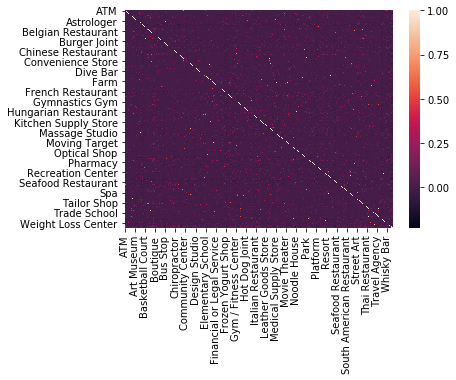

In [61]:
corr = X.corr()
sns.heatmap(corr)

Features are predominantly uncorrelated

In [62]:
c = X.corr().abs()
s = c.unstack()
so = s.sort_values(kind="quicksort")

In [63]:
c.head()

,ATM,Acai House,Accessories Store,Acupuncturist,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Alternative Healer,American Restaurant,...,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo,number_of_venues_within_radius,random
ATM,1.000000,0.009114,0.027312,0.096269,0.015281,0.007836,0.020012,0.009114,0.009114,0.022660,...,0.020030,0.035096,0.021536,0.011827,0.111104,0.023110,0.030391,0.009114,0.067516,0.067019
Acai House,0.009114,1.000000,0.008932,0.001669,0.002799,0.002933,0.003666,0.001669,0.001669,0.009631,...,0.496630,0.076422,0.007085,0.002166,0.009461,0.008953,0.008847,0.001669,0.041988,0.008616
Accessories Store,0.027312,0.008932,1.000000,0.008932,0.014975,0.015695,0.003715,0.008932,0.008932,0.004852,...,0.019630,0.005387,0.027919,0.011591,0.079430,0.259447,0.013486,0.008932,0.311589,0.003166
Acupuncturist,0.096269,0.001669,0.008932,1.000000,0.002799,0.002933,0.003666,0.001669,0.001669,0.011914,...,0.003669,0.007058,0.007085,0.002166,0.009461,0.008953,0.008847,0.001669,0.032757,0.006971
Adult Boutique,0.015281,0.002799,0.014975,0.002799,1.000000,0.004918,0.006146,0.002799,0.002799,0.005625,...,0.006151,0.070655,0.011879,0.003632,0.015861,0.015009,0.046477,0.002799,0.143484,0.044667


In [64]:
strong_correlations = []
correlation_threshold = 0.7
for colname in c.columns:
    if verbose == True:
        print("check for features strongly coorelated with " + colname)
    for i in range(0, len(c)):
        this_correlation = c[colname][i]
        if this_correlation >= correlation_threshold:
            if colname != c.index[i]: #don't act on self correlations
                if verbose == True:
                    print("   " + c.index[i] + " - " + str(this_correlation))
                strong_correlations.append((colname,c.index[i],this_correlation))

Whether or not I do anything about correlated features, they are interesting to look at.<br />
Some of them appear to be negatively correlated even I only show the magnitude of the correlation here.<br />
Some of the correlations look like they are due to small samples, such as the Roller Rink in San Francisco that is perfectly correlated with a Spiritual Center. I've actually skated there.<br />
Some correlations look meaningful, such as the correlation between aquariums and zoos.


In [65]:
strong_correlations_df = pd.DataFrame(strong_correlations)

In [66]:
strong_correlations_df["feature_pair"]=strong_correlations_df[0]+"-"+strong_correlations_df[1]

In [67]:
strong_correlations_df.drop([0,1],axis=1, inplace=True)

In [68]:
strong_correlations_df.rename(columns= {2: "correlaton"}, inplace=True)
strong_correlations_df.sort_values(by="correlaton",ascending=False,inplace=True)
strong_correlations_df.set_index("feature_pair", drop=True)

,correlaton
feature_pair,
Zoo-Planetarium,1.000000
Tuscan Restaurant-Theme Restaurant,1.000000
Memorial Site-Field,1.000000
Parking-College Track,1.000000
Field-Memorial Site,1.000000
Planetarium-Zoo,1.000000
Residential Building (Apartment / Condo)-Baseball Stadium,1.000000
Eye Doctor-Cultural Center,1.000000
Residential Building (Apartment / Condo)-Vineyard,1.000000


I wanted to see if there were strong correlations in the features, so I could remove some.<br />
With 400 or so features and something like 600 data points, I thought it would be good to remove redundant features.<br />
I found strongly correlated features, but my performance was good.<br /> I learned that Random Forests can be
tolerant of correlated features, so removing them seems uneccesary.

In [69]:
#strong_correlations_df

In [70]:
RF_all_features=RF("RF_all_features",X_train,y_train)

Random Forest - RF_all_features created


If the test accuracy is a lot lower than the train accuracy, it could be a sign of overfitting

In [71]:
RF_all_features.fit()

In [72]:
RF_all_features.predict(X_train)

In [73]:
RF_all_features.blahA()

452
RF_all_features Train accuracy = 0.9895833333333334
RF_all_features Train ROC AUC = 0.9998524964967919
RF_all_features Test accuracy = 0.8
RF_all_features Test ROC AUC = 0.8788875598086124
RF_all_features Num Features: 452


ROC Area Under Curve is a good way of measuring how well the binary classifier separates the two classes, even if the classes are unbalanced

In [74]:
 RF_all_features.rfc

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=15, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=0, verbose=0, warm_start=False)

In [75]:
estimator =  RF_all_features.f.estimators_[0]

In [76]:
estimator

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=15,
            max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False,
            random_state=209652396, splitter='best')

In [77]:
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = X.columns,
                class_names = ('near-Starbucks','not-near'),
                rounded = True, proportion = True, 
                precision = 2, filled = True)

Display a tree<br />
Note: this is only one tree <br />
Random Forest takes a vote from many trees <br />
It is possible however, to use only one tree (with some loss of accuracy),<br />
and interpret how the classifier is working

In [78]:
# Convert to png using system command (requires Graphviz)
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
Image(filename = 'tree.png')

Can we do better using recursive feature elimination?

In [79]:
rf_limited_features = RandomForestClassifier(n_estimators=100, max_depth=15, random_state=0)  
rfecv = RFECV(estimator=rf_limited_features, step=1, cv=2, scoring='roc_auc', verbose=2) 
selector=rfecv.fit(X_train, y_train)

Fitting estimator with 452 features.
Fitting estimator with 451 features.
Fitting estimator with 450 features.
Fitting estimator with 449 features.
Fitting estimator with 448 features.
Fitting estimator with 447 features.
Fitting estimator with 446 features.
Fitting estimator with 445 features.
Fitting estimator with 444 features.
Fitting estimator with 443 features.
Fitting estimator with 442 features.
Fitting estimator with 441 features.
Fitting estimator with 440 features.
Fitting estimator with 439 features.
Fitting estimator with 438 features.
Fitting estimator with 437 features.
Fitting estimator with 436 features.
Fitting estimator with 435 features.
Fitting estimator with 434 features.
Fitting estimator with 433 features.
Fitting estimator with 432 features.
Fitting estimator with 431 features.
Fitting estimator with 430 features.
Fitting estimator with 429 features.
Fitting estimator with 428 features.
Fitting estimator with 427 features.
Fitting estimator with 426 features.
F

In [80]:
#sk.metrics.SCORERS.keys()#this shows the scoring metric choices

In [81]:
reduced_features_preds = selector.predict(X_train)

In [82]:
selector.score(X_train,y_train)

1.0

In [83]:
selector_score = selector.score(X_test,y_test)
selector_score

0.825

In [84]:
selector.n_features_

142

In [85]:
selector

RFECV(cv=2,
   estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=15, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=0, verbose=0, warm_start=False),
   min_features_to_select=1, n_jobs=None, scoring='roc_auc', step=1,
   verbose=2)

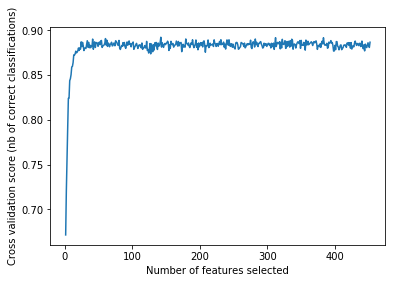

In [86]:
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show()

Selector picked 140 features, but that looks like a noisy spike<br />
Half that (~70) looks like it would do fine, but there is no real loss by keeping extra features<br />
Random Forest model does fairly well with extra features

Give svm a try

In [87]:
SVM_rbf = SVM("SVM (with rbf kernel)",'rbf', X_train, y_train, X_test, y_test)
SVM_rbf.fit()
SVM_rbf.predict(X_test)
SVM_rbf.print_scores()

Support Vector Machine - SVM (with rbf kernel) created
SVM (with rbf kernel) Train accuracy = 0.825
SVM (with rbf kernel) Test accuracy = 0.7916666666666666
SVM (with rbf kernel) Train ROC AUC = 0.9153698650342945
SVM (with rbf kernel) Test ROC AUC = 0.8660287081339714


In [88]:
SVM_rbf = SVM("SVM (with linear kernel)",'linear', X_train, y_train, X_test, y_test)
SVM_rbf.fit()
SVM_rbf.predict(X_test)
SVM_rbf.print_scores()

Support Vector Machine - SVM (with linear kernel) created
SVM (with linear kernel) Train accuracy = 0.7895833333333333
SVM (with linear kernel) Test accuracy = 0.7583333333333333
SVM (with linear kernel) Train ROC AUC = 0.8877498340585589
SVM (with linear kernel) Test ROC AUC = 0.8326854066985646


In [89]:
SVM_rbf = SVM("SVM (with poly kernel)",'poly', X_train, y_train, X_test, y_test)
SVM_rbf.fit()
SVM_rbf.predict(X_test)
SVM_rbf.print_scores()

Support Vector Machine - SVM (with poly kernel) created
SVM (with poly kernel) Train accuracy = 0.6541666666666667
SVM (with poly kernel) Test accuracy = 0.6583333333333333
SVM (with poly kernel) Train ROC AUC = 0.8730732354893429
SVM (with poly kernel) Test ROC AUC = 0.7724282296650719


In [90]:
SVM_rbf = SVM("SVM (with sigmoid kernel)",'sigmoid', X_train, y_train, X_test, y_test)
SVM_rbf.fit()
SVM_rbf.predict(X_test)
SVM_rbf.print_scores()

Support Vector Machine - SVM (with sigmoid kernel) created
SVM (with sigmoid kernel) Train accuracy = 0.7770833333333333
SVM (with sigmoid kernel) Test accuracy = 0.7166666666666667
SVM (with sigmoid kernel) Train ROC AUC = 0.8544509182093075
SVM (with sigmoid kernel) Test ROC AUC = 0.7897727272727273


Looks like RandomForest and SVM with an rbf kernel do well<br />
Maybe we should try those with smaller feature sets

In [91]:
#tried dropping my added feature but lets keep it
#X_train.drop(['number_of_venues_within_radius'], axis=1)
#X_test.drop(['number_of_venues_within_radius'], axis=1)

(452, 1)

In [119]:
X_val=[]
y_val=[]
RF_2 = RF2("Random Forest #2", X_train, y_train, X_test, y_test, X_val, y_val)
RF_2.fit()
RF_2.get_and_print_results()
RF_2.feature_importance_df



Random Forest - Random Forest #2 created
452
Random Forest #2 Train accuracy = 0.9895833333333334
Random Forest #2 Train ROC AUC = 0.9998524964967919
Random Forest #2 Test accuracy = 0.8
Random Forest #2 Test ROC AUC = 0.8788875598086124
Random Forest #2 Num Features: 452


,Feature Importance
Feature,
Fast Food Restaurant,0.072388
Sandwich Place,0.050793
number_of_venues_within_radius,0.044295
Mexican Restaurant,0.040154
Pharmacy,0.030160
Ice Cream Shop,0.027605
Pizza Place,0.025735
Shipping Store,0.023102
Grocery Store,0.022438


In [95]:
##### validate #####

Let's try this model on new data

In [96]:
#starbucks heavy area in Illinois
#41.916715, -87.989170
#41.843114, -87.779305
validate_llat = 41.843114
validate_llon = -87.989170
validate_ulat = 41.916715
validate_ulon = -87.779305
val_points = generate_points(validate_llat, validate_llon, validate_ulat, validate_ulon)

new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates
new row of coordinates


In [97]:
validation_points=pd.DataFrame(val_points)
len(validation_points)

420

In [98]:
validation_points = validation_points.sample(frac=1).reset_index(drop=True)
validation_points.head()

,0,1
0,41.846485,-87.837454
1,41.878900,-87.945801
2,41.851886,-87.822990
3,41.905911,-87.974707
4,41.868094,-87.887992


In [99]:
len(validation_points)

420

In [100]:

validation_venues = getNearbyVenues(latitudes = validation_points[0],
                              longitudes =  validation_points[1]
                               )

0.0%
23.809523809523807%
47.61904761904761%
71.42857142857143%
95.23809523809523%
nearby_venues length:1872
# of unique points in nearby_venues =420


In [101]:
len(validation_venues['Point Name'].unique())

420

In [102]:
validation_venues.tail()

,Point Name,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Distance,Venue Category
1867,point00418,41.895106,-87.960250,Party City,41.893865,-87.961207,159,Miscellaneous Shop
1868,point00418,41.895106,-87.960250,Hallmark Gold Crown,41.895043,-87.962264,167,Gift Shop
1869,point00418,41.895106,-87.960250,Avenue,41.894689,-87.961870,142,Women's Store
1870,point00418,41.895106,-87.960250,Plunkett Park,41.896836,-87.960987,202,Baseball Field
1871,point00419,41.857292,-87.945815,,0.000000,0.000000,0,No venues within radius


In [103]:
validation_points.head()

,0,1
0,41.846485,-87.837454
1,41.878900,-87.945801
2,41.851886,-87.822990
3,41.905911,-87.974707
4,41.868094,-87.887992


In [120]:
#sb_locations = getStarbucksLocations(vp0, vp1, radius=300, limit=100)
#nelat = 41.962643
#nelng = -87.757414
#swlat = 41.903702
#swlng = -87.896807
nelat = validate_llat
nelng = validate_llon
swlat = validate_ulat
swlng = validate_ulon
#sb_locations = getStarbucksLocations(nelat, nelng, swlat, swlng)
sb_locations = []
#for lat, lng in zip(validation_answer_key['point_lat'],validation_answer_key['point_lon']):   
count=0
for lat, lng in zip(validation_points[0],validation_points[1]):    


    sb_location_res = getStarbucksLocations2(lat, lng, limit=200)
    for sb_location in sb_location_res:
        print("lat=" + str(sb_location[0]) + "lon=" + str(sb_location[1])) 
        sb_locations.append((sb_location[0],sb_location[1]))   
        #print(sb_location)
            
            
    if(count%100 == 0):
                #print (float(count)/len(latitudes))*100,
                print("\r{0}".format((float(count)/len(validation_points[0]))*100)+"%")
    count = count + 1

no starbucks location results
0.0%
no starbucks location results
no starbucks location results
lat=41.90690672870483lon=-87.9773658442735
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
lat=41.88792815904419lon=-87.78204071127662
lat=41.888237lon=-87.781921
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbucks location results
no starbuc

In [121]:
sb_locations_df = pd.DataFrame(sb_locations)
sb_locations_df.tail()

,0,1
35,41.905357,-87.966690
36,41.908489,-87.823545
37,41.849655,-87.832806
38,41.918488,-87.940271
39,41.900664,-87.964542


In [122]:
validation_venues['Venue'].value_counts()

                                   71
Starbucks                          22
Dunkin'                            20
Walgreens                          19
McDonald's                         18
Subway                             15
7-Eleven                           14
Shell                              14
SUBWAY                             12
Redbox                             12
Chase Bank                         11
Jimmy John's                       11
GameStop                            9
Baskin-Robbins                      9
T-Mobile                            8
U.S. Bank ATM                       7
Dollar Tree                         7
CVS pharmacy                        7
Jewel-Osco                          6
Chipotle Mexican Grill              6
KFC                                 5
Panera Bread                        5
Family Dollar                       5
Party City                          5
Great Clips                         5
Wingstop                            5
LA Fitness  

In [123]:
# one hot encoding
validation_onehot = pd.get_dummies(validation_venues[['Venue Category']], prefix="", prefix_sep="")


In [124]:
validation_onehot.head()

,ATM,Accessories Store,African Restaurant,American Restaurant,Arcade,Art Gallery,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,...,Vietnamese Restaurant,Warehouse,Warehouse Store,Waste Facility,Weight Loss Center,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Yoga Studio
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [125]:
# add neighborhood column back to dataframe
validation_onehot['point_name'] = validation_venues['Point Name'] 
validation_onehot['point_lat'] = validation_venues['Neighborhood Latitude'] 
validation_onehot['point_lon'] = validation_venues['Neighborhood Longitude'] 
validation_onehot['isStarbucks'] = (validation_venues['Venue'] == "Starbucks")# should do a better fuzzy match
# move neighborhood column to the first column
#validation_fixed_columns = [validation_onehot.columns[-3]] + [validation_onehot.columns[-2]] + [validation_onehot.columns[-1]] + list(validation_onehot.columns[:-3])


In [126]:
# move neighborhood column to the first column
validation_fixed_columns = [validation_onehot.columns[-3]] + [validation_onehot.columns[-2]] + [validation_onehot.columns[-1]] + list(validation_onehot.columns[:-3])

In [127]:
len(validation_fixed_columns)

270

In [128]:
validation_onehot.columns

Index(['ATM', 'Accessories Store', 'African Restaurant', 'American Restaurant',
       'Arcade', 'Art Gallery', 'Arts & Crafts Store', 'Asian Restaurant',
       'Athletics & Sports', 'Auto Dealership',
       ...
       'Weight Loss Center', 'Whisky Bar', 'Wine Bar', 'Wings Joint',
       'Women's Store', 'Yoga Studio', 'point_name', 'point_lat', 'point_lon',
       'isStarbucks'],
      dtype='object', length=270)

In [129]:
len(validation_fixed_columns)

270

In [130]:
len(validation_onehot.columns)

270

In [131]:
validation_fixed_columns = [validation_onehot.columns[-3]] + [validation_onehot.columns[-2]] + [validation_onehot.columns[-1]] + list(validation_onehot.columns[:-3])

In [132]:
validation_onehot = validation_onehot[validation_fixed_columns]

In [133]:
validation_onehot.isStarbucks = validation_onehot.isStarbucks.astype(int)
validation_onehot.head()
validation_onehot['isStarbucks'].value_counts()
validation_venues.head()
len(validation_onehot)
validation_onehot.head()
validation_onehot.shape
validation_answer_key = validation_onehot
validation_answer_key.head()

,point_lat,point_lon,isStarbucks,ATM,Accessories Store,African Restaurant,American Restaurant,Arcade,Art Gallery,Arts & Crafts Store,...,Warehouse,Warehouse Store,Waste Facility,Weight Loss Center,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Yoga Studio,point_name
0,41.846485,-87.837454,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,point00000
1,41.878900,-87.945801,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,point00001
2,41.878900,-87.945801,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,point00001
3,41.878900,-87.945801,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,point00001
4,41.851886,-87.822990,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,point00002


In [134]:
validation_answer_key = validation_answer_key.groupby('point_name').mean()
validation_answer_key.head()
validation_answer_key.shape
validation_answer_key = validation_onehot.groupby('point_name').mean().reset_index()
validation_answer_key.head()

,point_name,point_lat,point_lon,isStarbucks,ATM,Accessories Store,African Restaurant,American Restaurant,Arcade,Art Gallery,...,Vietnamese Restaurant,Warehouse,Warehouse Store,Waste Facility,Weight Loss Center,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Yoga Studio
0,point00000,41.846485,-87.837454,0.000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1,point00001,41.878900,-87.945801,0.000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2,point00002,41.851886,-87.822990,0.000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
3,point00003,41.905911,-87.974707,0.125,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
4,point00004,41.868094,-87.887992,0.000,0.0,0.071429,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.071429,0.0


In [135]:
validation_points_near_starbucks = validation_onehot[validation_onehot.isStarbucks > 0]["point_name"]
if eliminate_starbucks_venue_rows == True:
    #keep the isStarbucks flag but throw out other venue info
    ##points_near_starbucks = onehot[onehot.isStarbucks > 0]["point_name"]
    validation_indexes_to_remember = validation_onehot[validation_onehot.isStarbucks > 0].index
    validation_points_near_starbucks
validation_points_near_starbucks_df = pd.DataFrame(validation_points_near_starbucks)
validation_points_near_starbucks_df.head()
for point_name in validation_points_near_starbucks_df.point_name:
    validation_onehot.loc[validation_onehot.point_name == point_name,"isStarbucks"] = 1
len(validation_onehot)

1872

In [137]:
 if eliminate_starbucks_venue_rows == True:
    for ind in validation_indexes_to_remember:
        validation_onehot = validation_onehot.drop([ind], axis=0)
len(validation_onehot)

len(validation_onehot.columns)
validation_onehot['number_of_venues_within_radius'] = 1
len(validation_onehot.columns)
validation_onehot['point_name']       

0       point00000
1       point00001
2       point00001
3       point00001
4       point00002
5       point00002
6       point00002
7       point00003
8       point00003
9       point00003
10      point00003
11      point00003
13      point00003
14      point00003
15      point00004
16      point00004
17      point00004
18      point00004
19      point00004
20      point00004
21      point00004
22      point00004
23      point00004
24      point00004
25      point00004
26      point00004
27      point00004
28      point00004
29      point00005
30      point00005
           ...    
1842    point00414
1843    point00415
1844    point00415
1845    point00415
1846    point00415
1847    point00416
1848    point00417
1849    point00417
1850    point00417
1851    point00417
1852    point00417
1853    point00417
1854    point00418
1855    point00418
1856    point00418
1857    point00418
1858    point00418
1859    point00418
1860    point00418
1861    point00418
1862    point00418
1863    poin

In [138]:
# create the new feature 'number_of_venues_within_radius'
# have to combine means and counts
validation_grouper = validation_onehot.groupby('point_name').mean().reset_index()
validation_counter = validation_onehot.groupby('point_name').count().reset_index()
validation_grouped = validation_grouper
validation_grouped.iloc[:,-1] = validation_counter.iloc[:,-1]
validation_max_of_venue_count = validation_grouped.iloc[:,-1].max()
# normalize the new feature
validation_grouped.iloc[:,-1] = validation_grouped.iloc[:,-1]/validation_max_of_venue_count
validation_grouped.iloc[:,-1].describe()

count    420.000000
mean       0.050054
std        0.078927
min        0.011364
25%        0.011364
50%        0.022727
75%        0.056818
max        1.000000
Name: number_of_venues_within_radius, dtype: float64

In [141]:
verbose = False
num_top_venues = 5
count = 0
for point in validation_grouped['point_name']:
    validation_temp = validation_grouped[validation_grouped['point_name'] == point].T.reset_index()
    validation_temp.columns = ['venue','freq']
    validation_temp = validation_temp.iloc[2:]
    validation_temp['freq'] = validation_temp['freq'].astype(float)
    validation_temp = validation_temp.round({'freq': 2})
    if verbose == True:
        print(str(count)+"----"+str(point)+"----")
        print(validation_temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
        print('\n')
    else:
        if count % 100 == 0:
            print("----"+point+"----")
            print(validation_temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
            print('\n')
    count = count + 1


----point00000----
                            venue  freq
0                            Pool  1.00
1  number_of_venues_within_radius  0.01
2                    Optical Shop  0.00
3   Paper / Office Supplies Store  0.00
4            Pakistani Restaurant  0.00


----point00100----
                            venue  freq
0          Furniture / Home Store  1.00
1  number_of_venues_within_radius  0.01
2                            Park  0.00
3                 Nature Preserve  0.00
4         New American Restaurant  0.00


----point00200----
                            venue  freq
0                Business Service  1.00
1  number_of_venues_within_radius  0.01
2                    Optical Shop  0.00
3   Paper / Office Supplies Store  0.00
4            Pakistani Restaurant  0.00


----point00300----
           venue  freq
0     Kids Store  0.14
1         Bakery  0.14
2           Park  0.14
3  Women's Store  0.14
4     Smoke Shop  0.14


----point00400----
                  venue  freq
0  Fast F

In [142]:
validation_grouped.shape

(420, 271)

In [143]:
validation_grouped.head()
validation_y = validation_grouped['isStarbucks'] > 0
validation_y = pd.DataFrame(validation_y)
validation_y = validation_y.isStarbucks.astype(int)
print(validation_y.value_counts())
validation_X = validation_grouped
print(validation_X.shape)
validation_map_data = validation_X
validation_X.drop(columns=['point_name', 'point_lat', 'point_lon', 'isStarbucks'], inplace=True)
validation_X.columns

0    399
1     21
Name: isStarbucks, dtype: int64
(420, 271)


Index(['ATM', 'Accessories Store', 'African Restaurant', 'American Restaurant',
       'Arcade', 'Art Gallery', 'Arts & Crafts Store', 'Asian Restaurant',
       'Athletics & Sports', 'Auto Dealership',
       ...
       'Warehouse', 'Warehouse Store', 'Waste Facility', 'Weight Loss Center',
       'Whisky Bar', 'Wine Bar', 'Wings Joint', 'Women's Store', 'Yoga Studio',
       'number_of_venues_within_radius'],
      dtype='object', length=267)

In [145]:
validation_X['random'] = np.random.random(size=len(validation_X))
print(validation_X.columns)
print(validation_X.shape)
validation_pdy=pd.DataFrame(validation_y)
validation_pdy['isStarbucks'].value_counts()

Index(['ATM', 'Accessories Store', 'African Restaurant', 'American Restaurant',
       'Arcade', 'Art Gallery', 'Arts & Crafts Store', 'Asian Restaurant',
       'Athletics & Sports', 'Auto Dealership',
       ...
       'Warehouse Store', 'Waste Facility', 'Weight Loss Center', 'Whisky Bar',
       'Wine Bar', 'Wings Joint', 'Women's Store', 'Yoga Studio',
       'number_of_venues_within_radius', 'random'],
      dtype='object', length=268)
(420, 268)


0    399
1     21
Name: isStarbucks, dtype: int64

In [146]:
#yikes - my features don't match
X.head()

,ATM,Acai House,Accessories Store,Acupuncturist,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Alternative Healer,American Restaurant,...,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo,number_of_venues_within_radius,random
0,0.0,0.0,0.03125,0.0,0.0,0.0,0.0,0.0,0.0,0.031250,...,0.0,0.0,0.0,0.0,0.031250,0.0,0.0,0.0,0.32,0.122240
1,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.10,0.313414
2,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.066667,...,0.0,0.0,0.0,0.0,0.033333,0.0,0.0,0.0,0.30,0.775553
3,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.03,0.640692
4,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.01,0.857592


In [147]:
X.shape

(600, 452)

In [148]:
#Let's see if we can fit this square peg into that round hole
matchup_validation_X = []
matchup_validation_X = pd.DataFrame(matchup_validation_X)

In [149]:
matchup_validation_X = pd.DataFrame(0, index=np.arange(len(validation_X)), columns=X.columns)

In [150]:
for val_col in validation_X.columns:
    matchup_validation_X[val_col] = validation_X[val_col]

In [151]:
matchup_validation_X.shape

(420, 482)

Looks like we have some extra columns at the end
Would be nice to have incorporated those extra rows at the beginning
For now, we just throw those extra columns out

In [152]:
while len(matchup_validation_X.columns) > len(X.columns):
    matchup_validation_X.drop(matchup_validation_X.columns[len(matchup_validation_X.columns)-1], axis=1, inplace=True)


In [153]:
matchup_validation_X.shape

(420, 452)

In [154]:
pd.DataFrame(X).shape

(600, 452)

In [157]:
validation_X = matchup_validation_X

In [161]:

###xxxxxxxxxx
X_val=validation_X
y_val=validation_y
RF_2 = RF2("Random Forest #2", X_train, y_train, X_test, y_test, X_val, y_val)
RF_2.fit()
RF_2.get_and_print_results()
RF_2.feature_importance_df

Random Forest - Random Forest #2 created
452
Random Forest #2 Train accuracy = 0.9895833333333334
Random Forest #2 Train ROC AUC = 0.9998524964967919
Random Forest #2 Test accuracy = 0.8
Random Forest #2 Test ROC AUC = 0.8788875598086124
Random Forest #2 Validation accuracy = 0.9
Random Forest #2 Validation ROC AUC = 0.8600071607590405
Random Forest #2 Num Features: 452


,Feature Importance
Feature,
Fast Food Restaurant,0.072388
Sandwich Place,0.050793
number_of_venues_within_radius,0.044295
Mexican Restaurant,0.040154
Pharmacy,0.030160
Ice Cream Shop,0.027605
Pizza Place,0.025735
Shipping Store,0.023102
Grocery Store,0.022438


In [162]:


###############
##############
#### validate end ###
################

In [166]:
validate_center_lat = validate_llat+(validate_ulat-validate_llat)/2
validate_center_lon = validate_llon+(validate_ulon-validate_llon)/2
validation_map = folium.Map(location=[validate_center_lat, validate_center_lon], zoom_start=12)

In [167]:


# add markers for known Starbucks to map
for lat, lng in zip(sb_locations_df[0],sb_locations_df[1]):    
    color_str = 'red'

    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color=color_str,        
        fill=False,
        #fill_color='#3186cc',
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(validation_map)  
    

    

In [168]:
# add markers for my predicted classes to map
#for lat, lng in zip(validation_venues['Neighborhood Latitude'],validation_venues['Neighborhood Longitude']):
##for lat, lng in zip(validation_points[0],validation_points[1]):
for lat, lng, isSB in zip(validation_answer_key['point_lat'],validation_answer_key['point_lon'],validation_answer_key['isStarbucks']):    

    if isSB > 0 :
        color_str = 'lime'
    else:
        color_str = 'navy'

    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color=color_str,        
        fill=False,
        #fill_color='#3186cc',
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(validation_map)  
    


In [169]:
validation_map

In [ ]:
##### end validate #####

In [173]:
feature_importance_df = RF_2.feature_importance_df

In [174]:
#Save original matrices before you start cutting them up (just for safe keeping in case needed again)
X_train_orig = X_train
y_train_orig = y_train
X_test_orig = X_test
y_test_orig = y_test
X_val_orig = X_val
y_val_orig = y_val
feature_importance_df_orig = feature_importance_df

In [198]:
def drop_features_below_cutoff(cutoff, feature_importance_df, this_df):
    count = 0
    for feature in feature_importance_df[cutoff:feature_importance_df.size].index: 
        if verbose == True:
            print("removing feature: " + str(feature) + " with importance = " + str(feature_importance_df.loc[feature]['Feature Importance']))
        this_df.drop(columns=[feature], inplace=True)
        
    # progress indicator for the impatient among us
    if(count%20 == 0):
        pass
        print("\r{0}".format((float(count)/len(feature_importance_df[cutoff:feature_importance_df.size]))*100)+"%")
    count = count + 1            
    return(this_df)

In [196]:
# drop features with importance below cutoff
cutoff = selector.n_features_
X_train = drop_features_below_cutoff(cutoff, feature_importance_df, X_train)
X_test = drop_features_below_cutoff(cutoff, feature_importance_df, X_test)    


KeyError: "['Construction & Landscaping'] not found in axis"

In [197]:
X_val = drop_features_below_cutoff(cutoff, feature_importance_df, X_val)  

0.0%


In [189]:
len(X_train.columns)

142

In [190]:
X_train.columns

Index(['ATM', 'Accessories Store', 'American Restaurant', 'Art Gallery',
       'Arts & Crafts Store', 'Asian Restaurant', 'Automotive Shop',
       'BBQ Joint', 'Bagel Shop', 'Bakery',
       ...
       'Video Store', 'Vietnamese Restaurant', 'Warehouse Store',
       'Weight Loss Center', 'Wine Shop', 'Wings Joint', 'Women's Store',
       'Yoga Studio', 'number_of_venues_within_radius', 'random'],
      dtype='object', length=142)

In [199]:
RF_3 = RF2("Random Forest #3", X_train, y_train, X_test, y_test, X_val, y_val)
RF_3.fit()
RF_3.get_and_print_results()
RF_3.feature_importance_df



Random Forest - Random Forest #3 created
142
Random Forest #3 Train accuracy = 0.9979166666666667
Random Forest #3 Train ROC AUC = 1.0
Random Forest #3 Test accuracy = 0.825
Random Forest #3 Test ROC AUC = 0.8767942583732058
Random Forest #3 Validation accuracy = 0.9
Random Forest #3 Validation ROC AUC = 0.8493256951903568
Random Forest #3 Num Features: 142


,Feature Importance
Feature,
Fast Food Restaurant,0.086578
Sandwich Place,0.068518
number_of_venues_within_radius,0.054775
Mexican Restaurant,0.043395
Pharmacy,0.030126
Pizza Place,0.029561
Grocery Store,0.027427
Mobile Phone Shop,0.024827
Bank,0.023937


In [203]:

def drop_features_on_all_sets(cutoff, X_train, X_test, X_val):
    X_train = drop_features_below_cutoff(cutoff, feature_importance_df, X_train)
    X_test = drop_features_below_cutoff(cutoff, feature_importance_df, X_test)
    X_val = drop_features_below_cutoff(cutoff, feature_importance_df, X_val) 
    return(X_train, X_test, X_val)

In [204]:

cutoff = 50
# drop features with importance below cutoff
drop_features_on_all_sets(cutoff, X_train, X_test, X_val)

#X_train = drop_features_below_cutoff(cutoff, feature_importance_df, X_train)
#X_test = drop_features_below_cutoff(cutoff, feature_importance_df, X_test)
#X_val = drop_features_below_cutoff(cutoff, feature_importance_df, X_val)


/home/jupyterlab/conda/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


0.0%
0.0%
0.0%


In [205]:
RF_4 = RF2("Random Forest #4", X_train, y_train, X_test, y_test, X_val, y_val)
RF_4.fit()
RF_4.get_and_print_results()
RF_4.feature_importance_df

Random Forest - Random Forest #4 created
50
Random Forest #4 Train accuracy = 0.9979166666666667
Random Forest #4 Train ROC AUC = 1.0
Random Forest #4 Test accuracy = 0.8083333333333333
Random Forest #4 Test ROC AUC = 0.8769437799043063
Random Forest #4 Validation accuracy = 0.8952380952380953
Random Forest #4 Validation ROC AUC = 0.8283804749970163
Random Forest #4 Num Features: 50


,Feature Importance
Feature,
Fast Food Restaurant,0.105080
Sandwich Place,0.094525
number_of_venues_within_radius,0.062479
Mexican Restaurant,0.054882
Pizza Place,0.037876
Pharmacy,0.036928
random,0.036000
Shipping Store,0.033963
Mobile Phone Shop,0.026140



Now let's set the cutoff to the feature importance level where the selector plot first hits<br />
the high plateau

In [208]:

cutoff = 20
# drop features with importance below cutoff
drop_features_on_all_sets(cutoff, X_train, X_test, X_val)

/home/jupyterlab/conda/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


0.0%
0.0%
0.0%


(     American Restaurant    Bakery      Bank  Burger Joint      Café  \
 150             0.000000  0.000000  0.000000      0.000000  0.000000   
 312             0.062500  0.000000  0.031250      0.031250  0.062500   
 195             0.000000  0.000000  0.000000      0.000000  0.000000   
 379             0.021277  0.000000  0.000000      0.000000  0.000000   
 112             0.000000  0.000000  0.000000      0.000000  0.058824   
 146             0.000000  0.000000  0.086957      0.000000  0.000000   
 244             0.000000  0.000000  0.000000      0.000000  0.000000   
 243             0.000000  0.000000  0.000000      0.000000  0.000000   
 35              0.000000  0.000000  0.000000      0.000000  0.000000   
 527             0.024390  0.048780  0.000000      0.000000  0.073171   
 338             0.000000  0.000000  0.000000      0.000000  0.055556   
 76              0.000000  0.000000  0.000000      0.000000  0.000000   
 438             0.000000  0.000000  0.000000      

In [ ]:
# drop features with importance below cutoff
#cutoff = 20
#X_train = drop_features_below_cutoff(cutoff, feature_importance_df, X_train)
#X_test = drop_features_below_cutoff(cutoff, feature_importance_df, X_test)   
#X_val = drop_features_below_cutoff(cutoff, feature_importance_df, X_val)   

In [209]:
RF_5 = RF2("Random Forest #5", X_train, y_train, X_test, y_test, X_val, y_val)
RF_5.fit()
RF_5.get_and_print_results()
RF_5.feature_importance_df

Random Forest - Random Forest #5 created
20
Random Forest #5 Train accuracy = 0.9979166666666667
Random Forest #5 Train ROC AUC = 0.9999262482483959
Random Forest #5 Test accuracy = 0.8166666666666667
Random Forest #5 Test ROC AUC = 0.8657296650717703
Random Forest #5 Validation accuracy = 0.8857142857142857
Random Forest #5 Validation ROC AUC = 0.8152524167561761
Random Forest #5 Num Features: 20


,Feature Importance
Feature,
Fast Food Restaurant,0.118523
Sandwich Place,0.115561
number_of_venues_within_radius,0.097000
Mexican Restaurant,0.075645
random,0.065386
Pharmacy,0.057763
Pizza Place,0.049508
Shipping Store,0.043312
Grocery Store,0.040668


Now let's set the cutoff to the feature importance level of the random feature

In [212]:
feature_importance_df.loc['random']

Feature Importance    0.065386
Name: random, dtype: float64

In [ ]:
# drop features with importance below cutoff
cutoff = 7
X_train = drop_features_below_cutoff(cutoff, feature_importance_df, X_train)
X_test = drop_features_below_cutoff(cutoff, feature_importance_df, X_test)    

In [ ]:
RF = RandomForestClassifier(n_estimators=100, max_depth=15, random_state=0)
fit = RF.fit(X_train, y_train)  
RF.predict(X_train)  
RF.score(X_train,y_train)
pred_test=RF.predict(X_test)  
print("Train accuracy = " + str(RF.score(X_train,y_train)))
print("Test accuracy = " + str(RF.score(X_test,y_test)))

# What about AUROC?
prob_y_train = RF.predict_proba(X_train)
prob_y_test = RF.predict_proba(X_test)
print("Train ROC AUC = " + str(roc_auc_score(y_train, prob_y_train[:,1])))
print("Test ROC AUC = " + str(roc_auc_score(y_test, prob_y_test[:,1])))
num_features = fit.n_features_
print("Num Features: " + str(num_features)) 

In [ ]:
feature_importances = RF.feature_importances_
feature_importance_info = []
for i in range(0,num_features):
    if feature_importances[i] >= 0:
        feature_importance_info.append((feature_importances[i],X_train.columns[i]))
feature_importance_df = pd.DataFrame(feature_importance_info)
feature_importance_df.rename(columns={0: "Feature Importance", 1: "Feature"}, inplace=True)
feature_importance_df.sort_values(by="Feature Importance",ascending=False,inplace=True)  
feature_importance_df.set_index('Feature',inplace=True)
feature_importance_df